#1.Carga de Librerias y Datos


*Se importan los módulos necesarios para trabajar*

In [1]:
#Pandas es utilizado para leer los set de datos
import pandas as pd
#Numpy es utilizado para generar las series de datos a graficar
import numpy as np
#Seaborn es utilizado para generar los gráficos
import seaborn as sns
import matplotlib.pyplot as plt
#Se importan modulos estadisticos para generar test de hipotesis, entre otros
from sklearn.preprocessing import StandardScaler
#Módulos implementa funciones que evalúan el error de predicción para propósitos específicos
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_absolute_percentage_error as mape
from sklearn.metrics import mean_squared_error as mse
#Ignorar warnings
import warnings
warnings.filterwarnings("ignore")

#Dividir arreglos o matrices en subconjuntos aleatorios de tren y prueba
from sklearn.model_selection import train_test_split

#Biblioteca de Redes Neuronales
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential, model_from_json
from keras.layers import Dropout, LSTM, Dense, Activation,Input
from tensorflow.keras.optimizers import SGD, Adam, RMSprop
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.wrappers.scikit_learn import KerasRegressor

from hyperopt import Trials, STATUS_OK, tpe, hp, fmin, space_eval
from sklearn.model_selection import cross_val_score, KFold, cross_val_predict, TimeSeriesSplit
import time, random, os

In [2]:
# Para acceder a los archivos del gdrive
from google.colab import drive
drive.mount('/content/gdrive/')


Mounted at /content/gdrive/


In [3]:
cd /content/gdrive/MyDrive/Tesis/Datos

/content/gdrive/MyDrive/Tesis/Datos


In [4]:
#Setear semilla
np.random.seed(42)
# Ajustar parámetros para reproducibilidad del entrenamiento
#tf.random.set_seed(123)
keras.utils.set_random_seed(123)
tf.config.experimental.enable_op_determinism()

In [5]:
df=pd.read_csv('df.csv')
df=df.drop(['Year', 'Week', 'Day','Month','Size','Type'], axis=1)

In [6]:
df.set_index('Date', inplace=True)


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 380380 entries, 2010-02-05 to 2012-10-26
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Store         380380 non-null  int64  
 1   Dept          380380 non-null  int64  
 2   Weekly_Sales  380380 non-null  float64
 3   IsHoliday     380380 non-null  bool   
 4   Temperature   380380 non-null  float64
 5   Fuel_Price    380380 non-null  float64
 6   MarkDown1     380380 non-null  float64
 7   MarkDown2     380380 non-null  float64
 8   MarkDown3     380380 non-null  float64
 9   MarkDown4     380380 non-null  float64
 10  MarkDown5     380380 non-null  float64
 11  CPI           380380 non-null  float64
 12  Unemployment  380380 non-null  float64
dtypes: bool(1), float64(10), int64(2)
memory usage: 38.1+ MB


#2. Obtener series de Tiempo

*Se obtiene lista de dataframe ordenados por Store y Dept*

In [8]:
series_time=[]
lista_Store=df.Store.unique()
lista_Store.sort()
lista_dept=df.Dept.unique()
lista_dept.sort()

for i in lista_Store:
  for j in lista_dept:
    #lista=[]
    test=df[(df.Store==i) & (df.Dept==j)]
    if(test.empty!=True):
        series_time.append(test)

In [9]:
len(series_time)

2660

#3.Normalizar base de datos

El **método de puntuación z** (a menudo llamado estandarización ) transforma los datos en una distribución con una media de 0 y una desviación estándar de 1 . Cada valor estandarizado se calcula restando la media de la característica correspondiente y luego dividiendo por la desviación estándar.

In [10]:
#Seleccion de caracteristicas
features =features = [feature for feature in df.columns if feature not in ('Store','Dept')]

#Se define escalado
std_scaler = StandardScaler()

series_time_scaled=[]



#Transformacion
for serie in series_time:
  for i in features:
    serie[i]=std_scaler.fit_transform(serie[i].values.reshape(-1,1))
  series_time_scaled.append(serie)

for i in features:
  df[i] = std_scaler.fit_transform(df[i].values.reshape(-1,1))

series_time_scaled[0]

,Store,Dept,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment
Date,,,,,,,,,,,,,
2010-02-05,1,1,0.245542,-0.274204,-1.830686,-1.521079,-0.524358,-0.193456,-0.092151,-0.336050,-0.579339,-1.130288,1.295958
2010-02-12,1,1,2.395781,3.646917,-2.098280,-1.577441,-0.524358,-0.193456,-0.092151,-0.336050,-0.579339,-1.096657,1.295958
2010-02-19,1,1,1.943233,-0.274204,-1.998285,-1.657288,-0.524358,-0.193456,-0.092151,-0.336050,-0.579339,-1.085823,1.295958
2010-02-26,1,1,-0.316684,-0.274204,-1.526473,-1.546911,-0.524358,-0.193456,-0.092151,-0.336050,-0.579339,-1.078788,1.295958
2010-03-05,1,1,-0.069800,-0.274204,-1.535627,-1.396612,-0.524358,-0.193456,-0.092151,-0.336050,-0.579339,-1.071754,1.295958
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-09-28,1,1,-0.363093,-0.274204,0.547388,1.048107,0.141879,-0.191745,-0.091796,0.020611,0.956274,1.611008,-1.836849
2012-10-05,1,1,-0.062002,-0.274204,0.017127,0.933034,0.943562,-0.193456,-0.088232,0.573847,0.594358,1.657095,-2.712884
2012-10-12,1,1,0.025529,-0.274204,-0.374406,0.895459,-0.145256,-0.193456,-0.090407,-0.184537,1.338915,1.703183,-2.712884


In [11]:
143*0.2

28.6

In [12]:
len(series_time_scaled)

2660

In [13]:
series_time_scaled=random.sample(series_time_scaled,110)

#4.Preparar datos para realizar aprendizaje supervizado.

La idea es modelar cada valor en función de los valores recientes anteriores, dado un retardo de tiempo dado. **Los valores futuros de una variable en una serie de tiempo dependen de sus propios rezagos y de los rezagos de otras variables.**

In [14]:
def time_delay_embedding(series: pd.Series, n_lags: int, horizon: int):
    """
    Incrustación de retardo de tiempo
    :param series: serie de tiempo como objeto de pandas
    :param n_lags: número de valores pasados para usar como variables explicativas
    :param horizon: horizonte de pronostico
    :return:pd.DataFrame con series temporales reconstruidas
    """
    assert isinstance(series, pd.Series)

    if series.name is None:
        name = 'Series'
    else:
        name = series.name

    n_lags_iter = list(range(n_lags, -horizon, -1))

    serie_time_delay = [series.shift(i) for i in n_lags_iter]
    serie_time_delay = pd.concat(serie_time_delay, axis=1).dropna()
    serie_time_delay.columns = [f'{name}(t-{j - 1})'
                 if j > 0 else f'{name}(t+{np.abs(j) + 1})'
                 for j in n_lags_iter]

    return serie_time_delay

In [15]:
series_predic=[]
series_target=[]
for serie in series_time_scaled:
  serie_split = []
  for columna in serie:
    col_df = time_delay_embedding(
        serie[columna],     #Serie de tiempo
        n_lags=1,           #Numero de retrasos
        horizon=1           # Horizonte de prediccion
          )
    serie_split.append(col_df)

  serie_df = pd.concat(serie_split, axis=1).dropna()
  predictor_variables = serie_df.columns.str.contains('\(t\-')
  target_variables = serie_df.columns.str.contains('Weekly_Sales\(t\+')

  predictor_variables = serie_df.iloc[:, predictor_variables]
  target_variables = serie_df.iloc[:, target_variables]
  series_predic.append(predictor_variables)
  series_target.append(target_variables)

In [16]:
#Ejemplo de variables de prediccion de una serie
series_predic[0].head(4)

,Store(t-0),Dept(t-0),Weekly_Sales(t-0),IsHoliday(t-0),Temperature(t-0),Fuel_Price(t-0),MarkDown1(t-0),MarkDown2(t-0),MarkDown3(t-0),MarkDown4(t-0),MarkDown5(t-0),CPI(t-0),Unemployment(t-0)
Date,,,,,,,,,,,,,
2010-02-12,4.0,25.0,0.057108,-0.274204,-1.146992,-1.489682,-0.503168,-0.192089,-0.096222,-0.358879,-0.591212,-1.208346,1.876953
2010-02-19,4.0,25.0,-0.338450,3.646917,-2.072358,-1.549850,-0.503168,-0.192089,-0.096222,-0.358879,-0.591212,-1.179081,1.876953
2010-02-26,4.0,25.0,-0.610926,-0.274204,-1.600372,-1.629271,-0.503168,-0.192089,-0.096222,-0.358879,-0.591212,-1.162865,1.876953
2010-03-05,4.0,25.0,-1.192679,-0.274204,-1.295845,-1.508936,-0.503168,-0.192089,-0.096222,-0.358879,-0.591212,-1.148825,1.876953


In [17]:
#Ejemplo de variables objetivo de una serie
series_target[0].head(4)

,Weekly_Sales(t+1)
Date,
2010-02-12,-0.338450
2010-02-19,-0.610926
2010-02-26,-1.192679
2010-03-05,-1.255793


In [18]:
#Se separa conjunto en entrenamiento y prueba; sin aleatoriedad
#Dejando un %20 de la data para test
X_train=pd.DataFrame()
X_test=pd.DataFrame()
Y_train=pd.DataFrame()
Y_test=pd.DataFrame()

for serie,target in zip(series_predic,series_target):
  X_train_i, X_test_i, Y_train_i, Y_test_i = train_test_split(serie, target, test_size=0.2, shuffle=False)
  X_train=pd.concat([X_train, X_train_i])
  X_test=pd.concat([X_test, X_test_i])
  Y_train=pd.concat([Y_train, Y_train_i])
  Y_test=pd.concat([Y_test, Y_test_i])

shape_x_test=X_test.shape
shape_y_test=Y_test.shape

print("Separacion de datos terminada!")

Separacion de datos terminada!


#Resultados

##SVR

In [19]:
import joblib

In [26]:
result_svr=pd.read_csv('results_SVR_Wallmart.csv')
result_svr = result_svr.sort_values(by='MSE', ascending=True)
result_svr.head(5)

,index,nameModel,trial_optimizacion_bayesiana,Step_validacion,time,MSE,RMSE,MAE,MAPE
101,101,SVR_Wallmart_21_2_linear_0.1_0.2_scale,21,2,0.089041,0.411165,8.750326,0.641222,0.477221
196,196,SVR_Wallmart_40_2_linear_0.1_0.2_scale,40,2,0.090399,0.411165,8.750326,0.641222,0.477221
156,156,SVR_Wallmart_32_2_linear_0.1_0.2_scale,32,2,0.096840,0.411165,8.750326,0.641222,0.477221
139,139,SVR_Wallmart_28_5_linear_0.1_0.1_scale,28,5,0.549153,0.412342,9.551642,0.642138,0.478596
109,109,SVR_Wallmart_22_5_linear_0.1_0.1_scale,22,5,0.543340,0.412342,9.551642,0.642138,0.478596


In [33]:
nombre_archivo=result_svr['nameModel'].iloc[0]
nombre_archivo="SVR_linear_0.1_0.2_scale"

In [34]:
nombre_json=nombre_archivo+"."+"pkl"
carpeta_destino = '/content/gdrive/MyDrive/Tesis/Datos/result_SVR'
ruta = os.path.join(carpeta_destino, nombre_json)

In [35]:
load_model = joblib.load(ruta) # Carga del modelo.


###Grafico de prediccion

In [36]:
#Se realiza prediccion
results = load_model.predict(X_test)

In [38]:
def divide_array(array, num_parts):
  i=0
  j=0
  largo=int(len(array)/num_parts)
  j=largo
  series_results=[]

  x=[]
  for k in range(num_parts):
    aux= array[i:j]
    j=largo+j
    i=i+largo
    series_results.append(aux)
    x.append(aux)

  return x

In [39]:
series_result_predict=divide_array(results,110)
series_result_real=divide_array(Y_test,110)

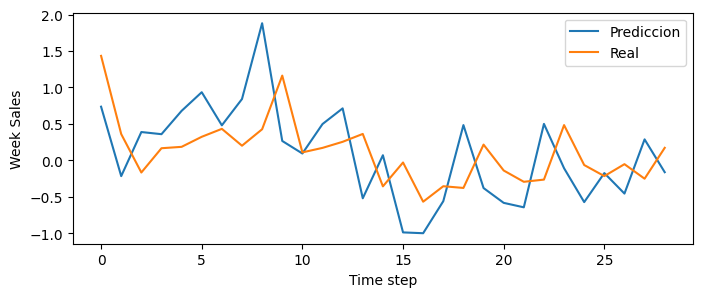

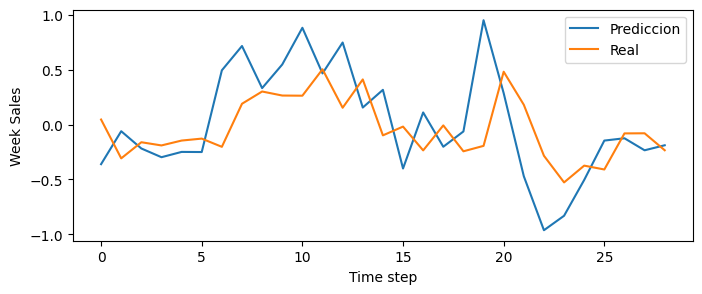

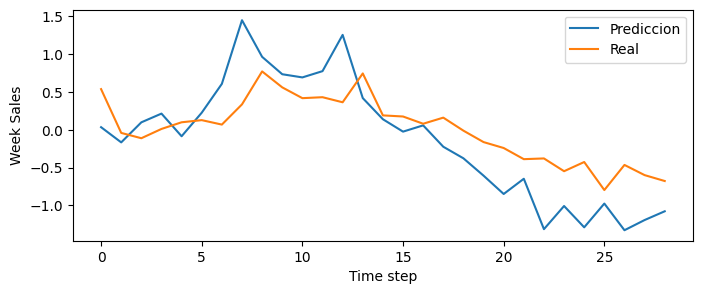

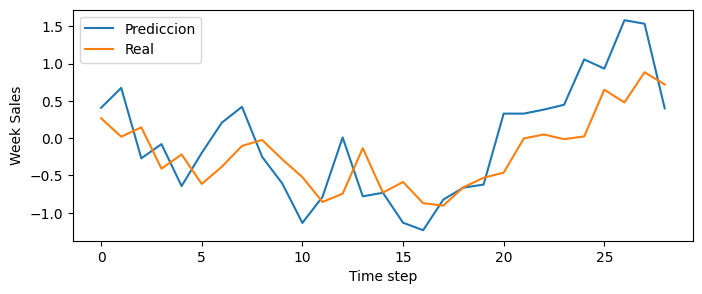

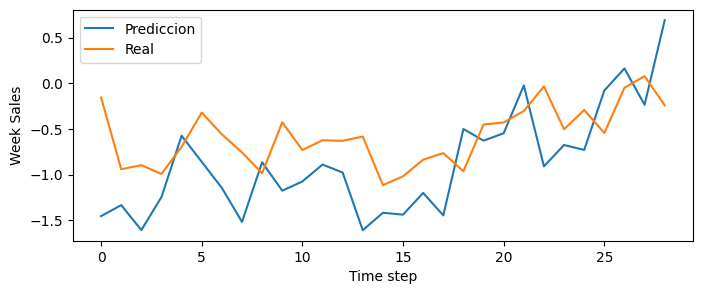

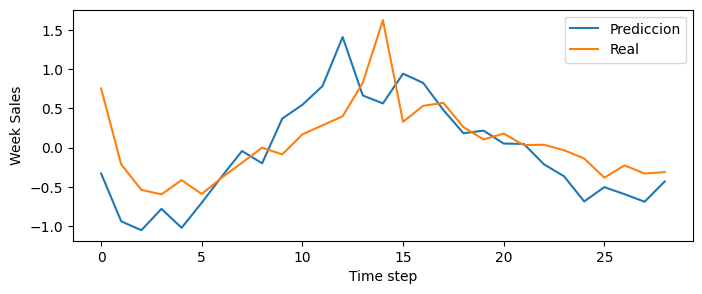

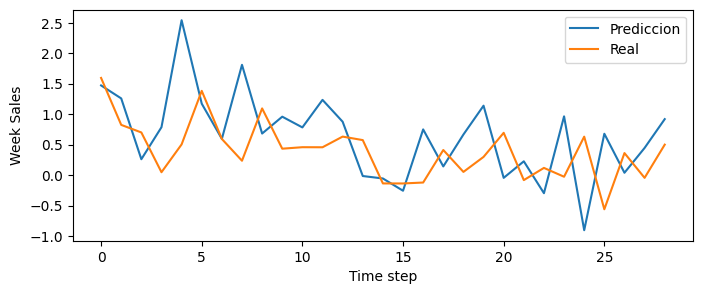

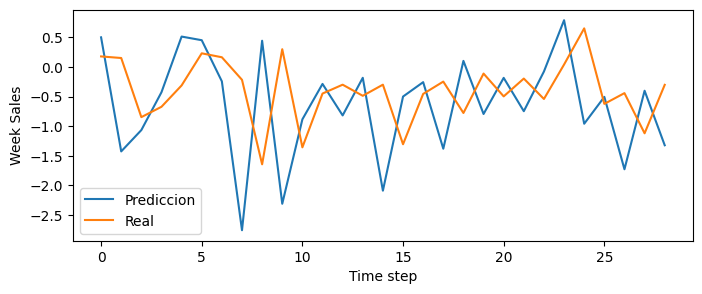

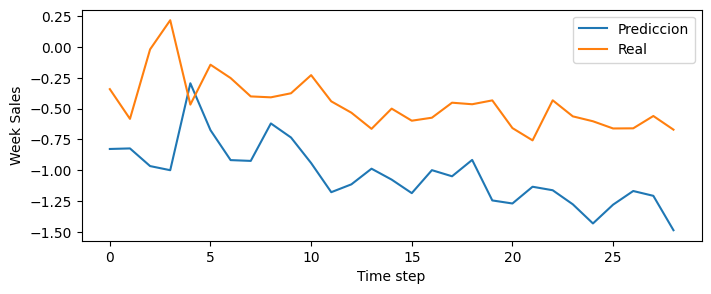

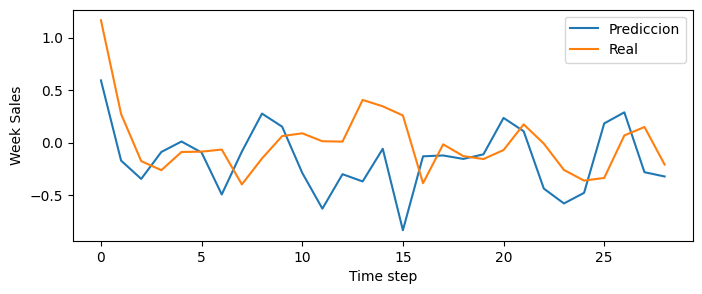

In [40]:
series_result_predict=series_result_predict[0:10]
series_result_real=series_result_real[0:10]
for predict, real in zip(series_result_predict,series_result_real):
  #Grafico de prediccion con el valor real
  tiempo=[x for x in range(predict.shape[0])]
  plt.figure(figsize=(8,3))
  plt.plot(tiempo,real)
  plt.ylabel('Week Sales', size=10)
  plt.plot(tiempo,predict)
  plt.xlabel('Time step', size=10)
  plt.legend(['Prediccion','Real'])
  plt.show()

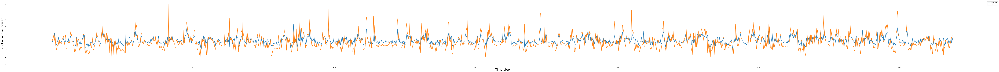

In [ ]:
#Grafico de prediccion con el valor real
tiempo=[x for x in range(Y_test.shape[0])]
plt.figure(figsize=(150,10))
plt.plot(tiempo,results)
plt.ylabel('Global_active_power', size=25)
plt.plot(tiempo,Y_test)
plt.xlabel('Time step', size=25)
plt.legend(['Prediccion','Real'])
plt.show()

## MLP

###Exportar resultados

In [22]:
result_mlp=pd.read_csv('results_MLP_Wallmart.csv')
result_mlp = result_mlp.sort_values(by='MSE', ascending=True)
result_mlp.head(5)


,Unnamed: 0,nameModel,trial_optimizacion_bayesiana,Step_validacion,time,MSE,RMSE,MAE,MAPE
63,63,MLP_Wallmart_13_4_800_20.0_2.0_416.0_0.52_adam...,13,4,22.453038,0.452941,0.673009,0.497926,176.674988
23,23,MLP_Wallmart_5_4_800_70.0_1.0_224.0_0.49_adam_...,5,4,9.778895,0.454599,0.674240,0.500750,171.819305
24,24,MLP_Wallmart_5_5_800_70.0_1.0_224.0_0.49_adam_...,5,5,4.642483,0.460354,0.678494,0.505545,170.328751
248,248,MLP_Wallmart_50_4_800_20.0_1.0_224.0_0.46_adam...,50,4,13.896975,0.468057,0.684147,0.506974,168.532791
62,62,MLP_Wallmart_13_3_800_20.0_2.0_416.0_0.52_adam...,13,3,7.579901,0.468259,0.684294,0.510273,146.675659


In [21]:
nombre_archivo=result_mlp['nameModel'].iloc[0]
nombre_archivo

'SVR_Wallmart_21_2_linear_0.1_0.2_scale'

In [ ]:
nombre_json=nombre_archivo+"."+"json"
carpeta_destino = '/content/gdrive/MyDrive/Tesis/Datos/result_MLP'
ruta = os.path.join(carpeta_destino, nombre_json)
save_w=nombre_archivo+"."+"h5"
weights_path = os.path.join(carpeta_destino, save_w)

In [ ]:
# load json and create model
json_file = open(ruta, 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
# load weights into new model
loaded_model.load_weights(weights_path)
print("Loaded model from disk")

# evaluate loaded model on test data
loaded_model.compile(loss='mean_squared_error', optimizer=Adam(learning_rate=4.88430493556068e-05), metrics = [tf.keras.metrics.MeanSquaredError(),
                            tf.keras.metrics.RootMeanSquaredError(),
                            tf.keras.metrics.MeanAbsoluteError(),
                            tf.keras.metrics.MeanAbsolutePercentageError()])


Loaded model from disk


###Grafico de prediccion

In [ ]:
#Se realiza prediccion
results = loaded_model.predict(X_test)

100/100 [==============================] - 0s 2ms/step


In [ ]:
#Metricas de precision del modelo
score = loaded_model.evaluate(X_test, Y_test, verbose = 0)
print('MSE:', score[1])
print('RMSE:', score[2])
print('MAE:', score[3])
print('MAPE:', score[4])

MSE: 0.5372093915939331
RMSE: 0.7329456806182861
MAE: 0.5607965588569641
MAPE: 201.93582153320312


In [ ]:
def divide_array(array, num_parts):
  i=0
  j=0
  largo=int(len(array)/num_parts)
  j=largo
  series_results=[]

  x=[]
  for k in range(num_parts):
    aux= array[i:j]
    j=largo+j
    i=i+largo
    series_results.append(aux)
    x.append(aux)

  return x

In [ ]:
series_result_predict=divide_array(results,110)
series_result_real=divide_array(Y_test,110)

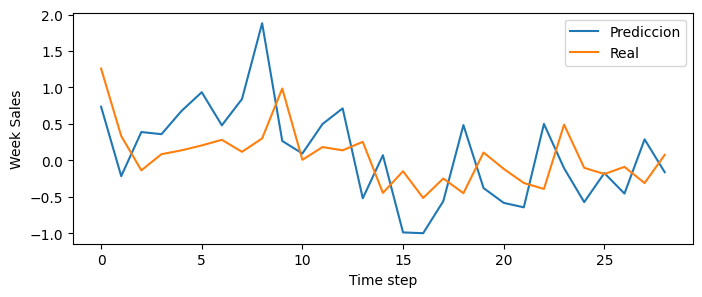

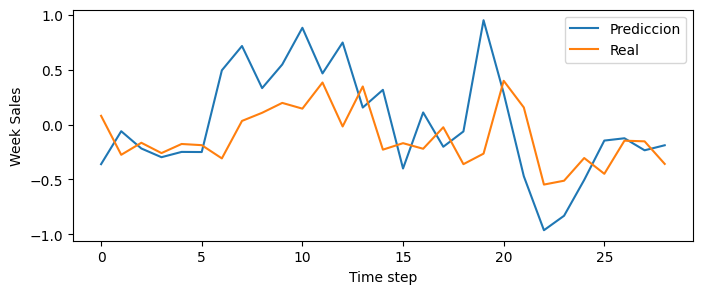

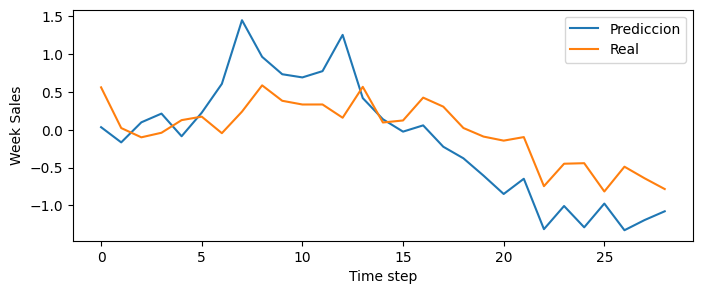

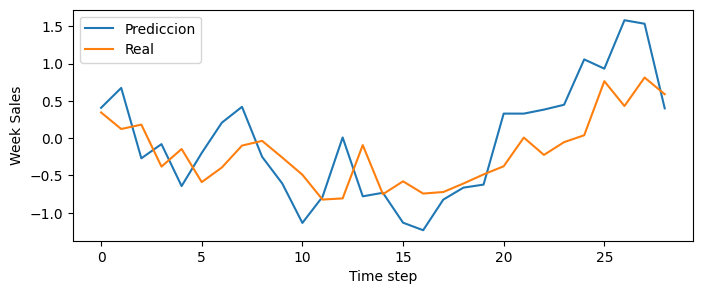

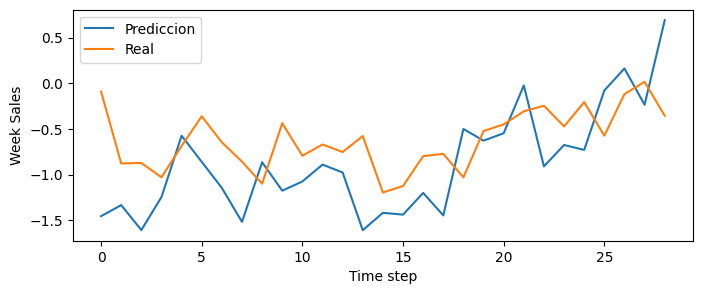

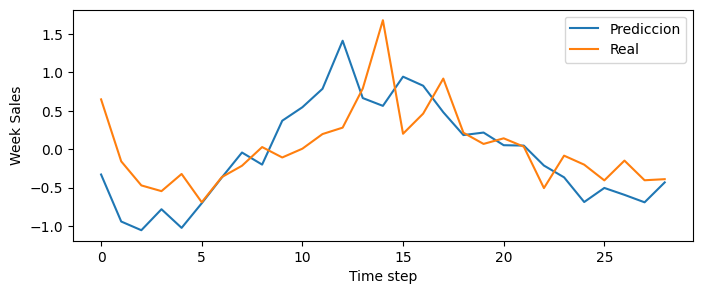

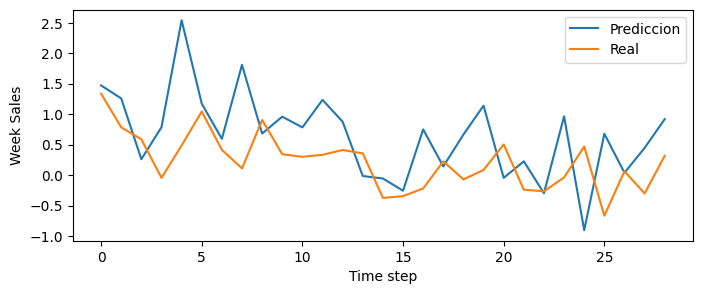

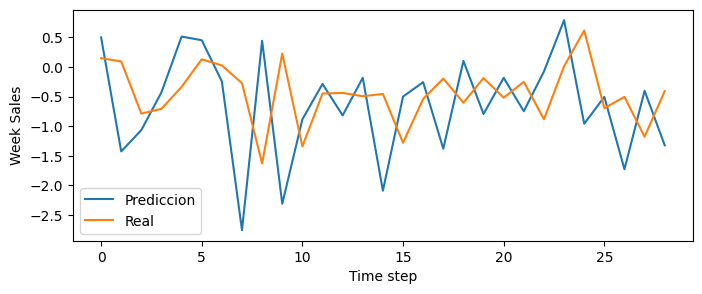

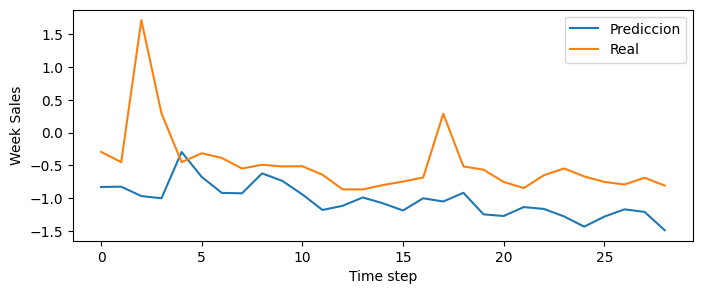

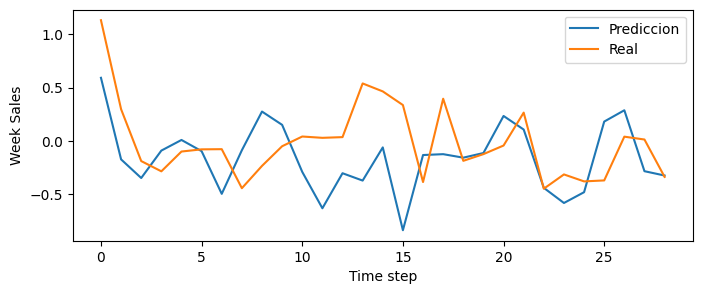

In [ ]:
series_result_predict=series_result_predict[0:10]
series_result_real=series_result_real[0:10]
for predict, real in zip(series_result_predict,series_result_real):
  #Grafico de prediccion con el valor real
  tiempo=[x for x in range(predict.shape[0])]
  plt.figure(figsize=(8,3))
  plt.plot(tiempo,real)
  plt.ylabel('Week Sales', size=10)
  plt.plot(tiempo,predict)
  plt.xlabel('Time step', size=10)
  plt.legend(['Prediccion','Real'])
  plt.show()

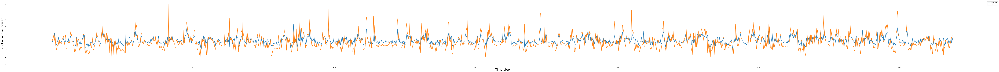

In [ ]:
#Grafico de prediccion con el valor real
tiempo=[x for x in range(Y_test.shape[0])]
plt.figure(figsize=(150,10))
plt.plot(tiempo,results)
plt.ylabel('Global_active_power', size=25)
plt.plot(tiempo,Y_test)
plt.xlabel('Time step', size=25)
plt.legend(['Prediccion','Real'])
plt.show()

## CNN

###Exportar resultados

In [ ]:
result_cnn=pd.read_csv('results_CNN_Wallmart.csv')
result_cnn = result_cnn.sort_values(by='MSE', ascending=True)
result_cnn.head(5)


,Unnamed: 0,nameModel,trial_optimizacion_bayesiana,Step_validacion,time,MSE,RMSE,MAE,MAPE
94,94,CNN_Wallmart_19_5_800_100.0_2.0_100.0_0.51_ada...,19,5,23.888380,0.412506,0.642267,0.460968,216.787018
213,213,CNN_Wallmart_43_4_800_10.0_2.0_200.0_0.46_adam...,43,4,108.787956,0.412562,0.642310,0.474048,237.853683
193,193,CNN_Wallmart_39_4_800_40.0_2.0_400.0_0.43_adam...,39,4,25.038480,0.425129,0.652019,0.475345,203.360809
68,68,CNN_Wallmart_14_4_800_70.0_2.0_700.0_0.66_adam...,14,4,27.102685,0.429269,0.655186,0.477540,241.695984
212,212,CNN_Wallmart_43_3_800_10.0_2.0_200.0_0.46_adam...,43,3,108.869204,0.429327,0.655230,0.470942,190.905502


In [ ]:
nombre_archivo=result_cnn['nameModel'].iloc[0]
nombre_archivo

'CNN_Wallmart_19_5_800_100.0_2.0_100.0_0.51_adam_4.926993343790581e-05_2_96.0'

In [ ]:
nombre_json=nombre_archivo+"."+"json"
carpeta_destino = '/content/gdrive/MyDrive/Tesis/Datos/result_CNN'
ruta = os.path.join(carpeta_destino, nombre_json)
save_w=nombre_archivo+"."+"h5"
weights_path = os.path.join(carpeta_destino, save_w)

In [ ]:
# load json and create model
json_file = open(ruta, 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
# load weights into new model
loaded_model.load_weights(weights_path)
print("Loaded model from disk")

# evaluate loaded model on test data
loaded_model.compile(loss='mean_squared_error', optimizer=Adam(learning_rate=4.926993343790581e-05), metrics = [tf.keras.metrics.MeanSquaredError(),
                            tf.keras.metrics.RootMeanSquaredError(),
                            tf.keras.metrics.MeanAbsoluteError(),
                            tf.keras.metrics.MeanAbsolutePercentageError()])


Loaded model from disk


###Grafico de prediccion

In [ ]:
#Se da formato de entradas como: Un tensor 3D con la forma [batch, timesteps, feature]
X_train_cnn=np.array(X_train)
X_train_cnn = X_train_cnn.reshape((X_train_cnn.shape[0],X_train_cnn.shape[1],1))

Y_train_cnn=np.array(Y_train)
Y_train_cnn = Y_train_cnn.reshape((Y_train_cnn.shape[0],Y_train_cnn.shape[1],1))

X_test_cnn=np.array(X_test)
X_test_cnn = X_test_cnn.reshape((X_test_cnn.shape[0],X_test_cnn.shape[1],1))

Y_test_cnn=np.array(Y_test)
Y_test_cnn = Y_test_cnn.reshape((Y_test_cnn.shape[0], Y_test_cnn.shape[1],1))

In [ ]:
#Se realiza prediccion
results = loaded_model.predict(X_test_cnn)

19/19 [==============================] - 0s 2ms/step


In [ ]:
series_result_predict=divide_array(results,20)
series_result_real=divide_array(Y_test,20)

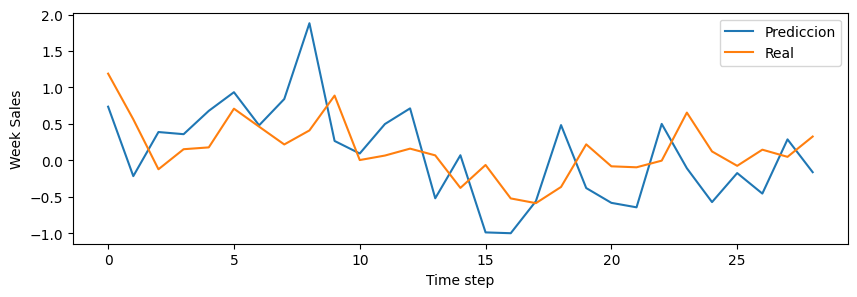

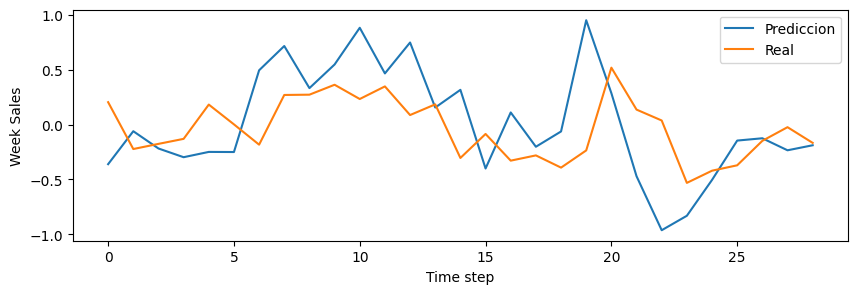

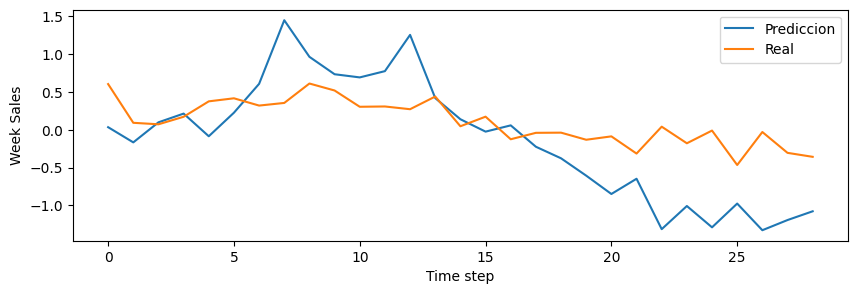

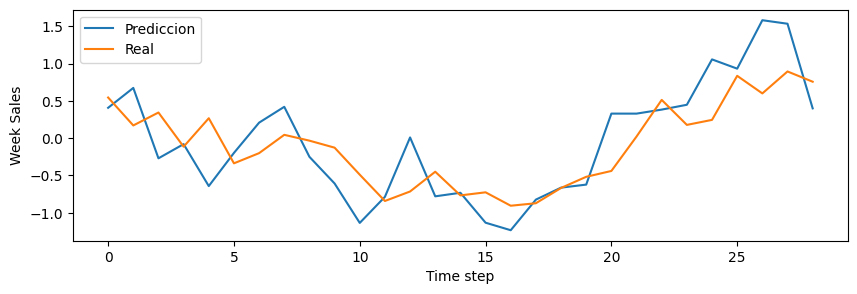

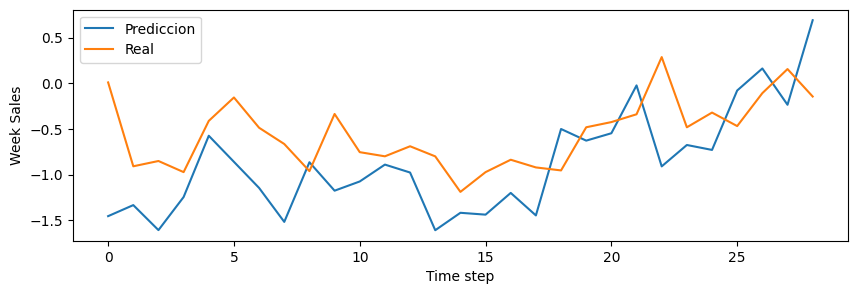

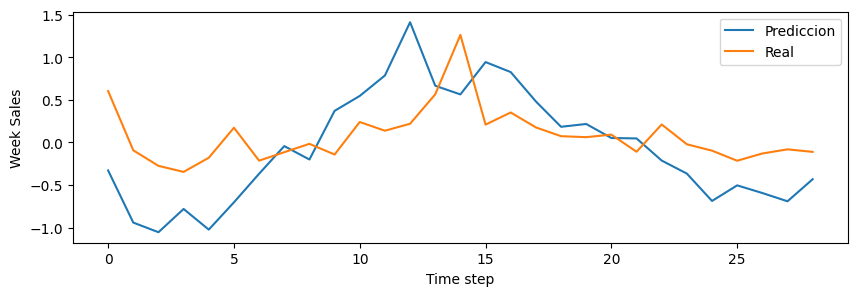

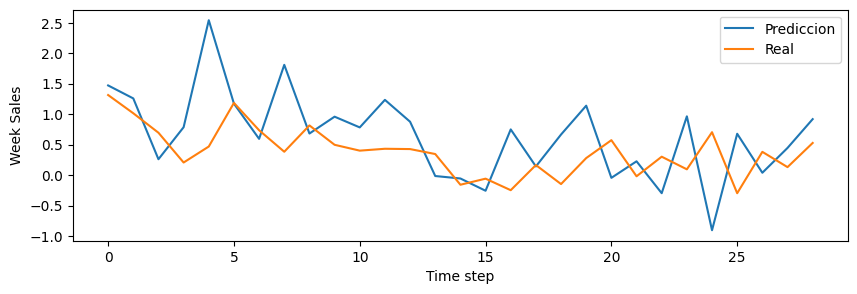

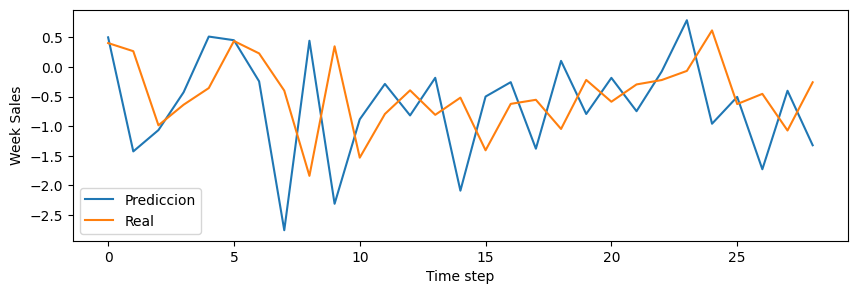

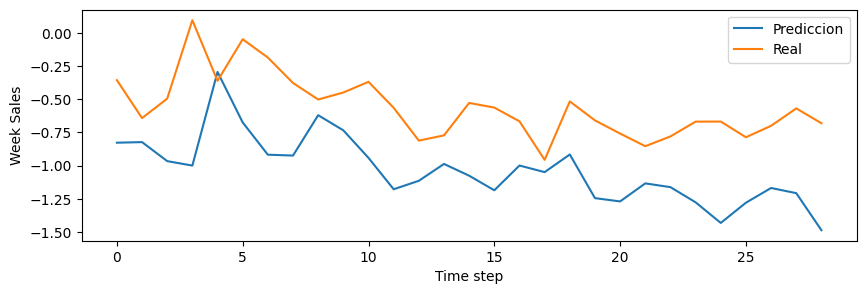

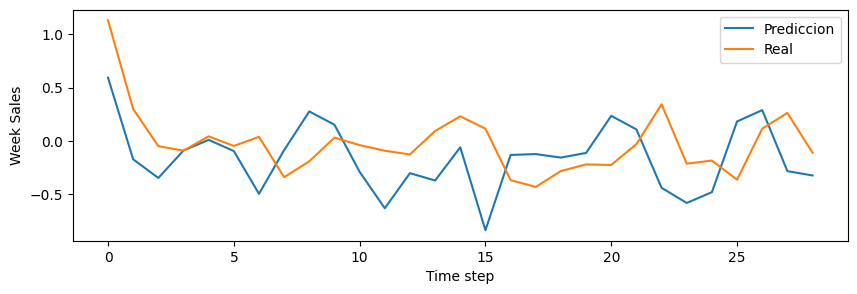

In [ ]:
series_result_predict=series_result_predict[0:10]
series_result_real=series_result_real[0:10]
for predict, real in zip(series_result_predict,series_result_real):
  #Grafico de prediccion con el valor real
  tiempo=[x for x in range(predict.shape[0])]
  plt.figure(figsize=(8,3))
  plt.plot(tiempo,real)
  plt.ylabel('Week Sales', size=10)
  plt.plot(tiempo,predict)
  plt.xlabel('Time step', size=10)
  plt.legend(['Prediccion','Real'])
  plt.show()

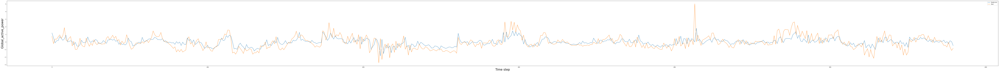

In [ ]:
#Grafico de prediccion con el valor real
tiempo=[x for x in range(Y_test.shape[0])]
plt.figure(figsize=(150,10))
plt.plot(tiempo,results)
plt.ylabel('Global_active_power', size=25)
plt.plot(tiempo,Y_test)
plt.xlabel('Time step', size=25)
plt.legend(['Prediccion','Real'])
plt.show()

##GRU

###Exportar resultados

In [ ]:
result_gru=pd.read_csv('results_GRU_Wallmart.csv')
result_gru = result_gru.sort_values(by='MSE', ascending=True)
result_gru.head(5)


,Unnamed: 0,nameModel,trial_optimizacion_bayesiana,Step_validacion,time,MSE,RMSE,MAE,MAPE
72,72,GRU_Wallmart_15_3_800_20.0_3.0_660.0_0.46_adam...,15,3,55.877682,0.449797,0.670669,0.484561,214.838333
57,57,GRU_Wallmart_12_3_800_50.0_1.0_240.0_0.68_adam...,12,3,51.905466,0.453476,0.673406,0.496651,208.590561
237,237,GRU_Wallmart_48_3_800_20.0_3.0_280.0_0.49_adam...,48,3,120.234842,0.454149,0.673906,0.496059,211.382980
42,42,GRU_Wallmart_9_3_800_40.0_3.0_680.0_0.68_adam_...,9,3,48.516264,0.456342,0.675531,0.495815,203.691544
97,97,GRU_Wallmart_20_3_800_50.0_2.0_760.0_0.58_adam...,20,3,22.625808,0.457379,0.676298,0.495662,192.737686


In [ ]:
nombre_archivo=result_gru['nameModel'].iloc[0]
nombre_archivo

'GRU_Wallmart_15_3_800_20.0_3.0_660.0_0.46_adam_2.826400498186163e-05'

In [ ]:
nombre_json=nombre_archivo+"."+"json"
carpeta_destino = '/content/gdrive/MyDrive/Tesis/Datos/result_GRU'
ruta = os.path.join(carpeta_destino, nombre_json)
save_w=nombre_archivo+"."+"h5"
weights_path = os.path.join(carpeta_destino, save_w)

In [ ]:
# load json and create model
json_file = open(ruta, 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
# load weights into new model
loaded_model.load_weights(weights_path)
print("Loaded model from disk")

# evaluate loaded model on test data
loaded_model.compile(loss='mean_squared_error', optimizer=Adam(learning_rate=2.826400498186163e-05), metrics = [tf.keras.metrics.MeanSquaredError(),
                            tf.keras.metrics.RootMeanSquaredError(),
                            tf.keras.metrics.MeanAbsoluteError(),
                            tf.keras.metrics.MeanAbsolutePercentageError()])


Loaded model from disk


###Grafico de prediccion

In [ ]:
#Se da formato de entradas como: Un tensor 3D con la forma [batch, timesteps, feature]
X_train_gru=np.array(X_train)
X_train_gru = X_train_gru.reshape((X_train_gru.shape[0],1,X_train_gru.shape[1]))

Y_train_gru=np.array(Y_train)
Y_train_gru = Y_train_gru.reshape((Y_train_gru.shape[0],1,Y_train_gru.shape[1]))

X_test_gru=np.array(X_test)
X_test_gru = X_test_gru.reshape((X_test_gru.shape[0],1,X_test_gru.shape[1]))

Y_test_gru=np.array(Y_test)
Y_test_gru = Y_test_gru.reshape((Y_test_gru.shape[0],1, Y_test_gru.shape[1]))

In [ ]:
#Se realiza prediccion
results = loaded_model.predict(X_test_gru)


19/19 [==============================] - 2s 16ms/step


In [ ]:
results.shape

(580, 1, 1)

In [ ]:
results = results.reshape(shape_y_test)

In [ ]:
series_result_predict=divide_array(results,20)
series_result_real=divide_array(Y_test,20)

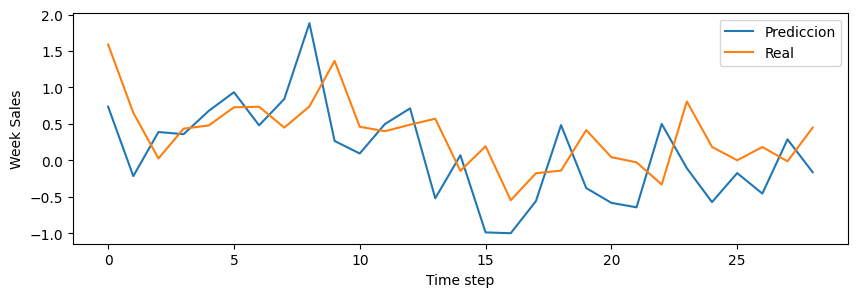

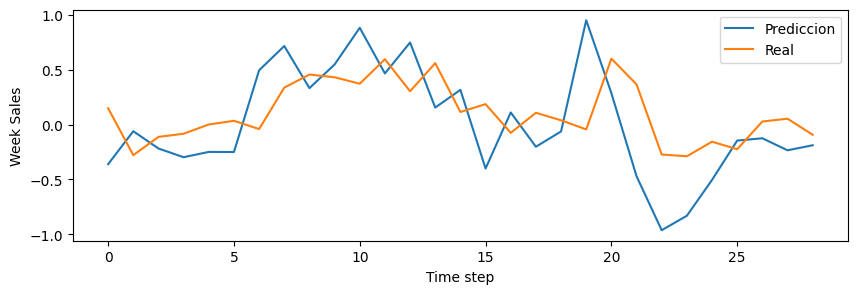

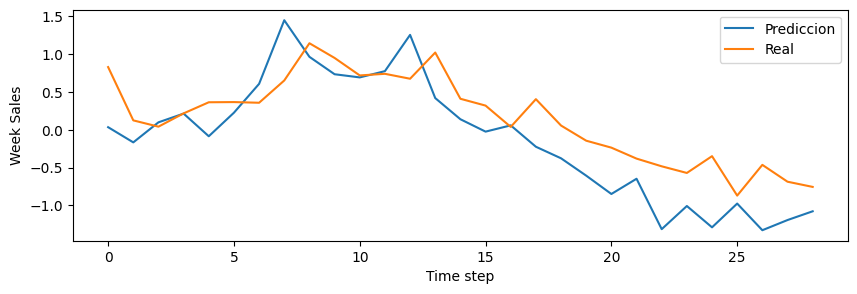

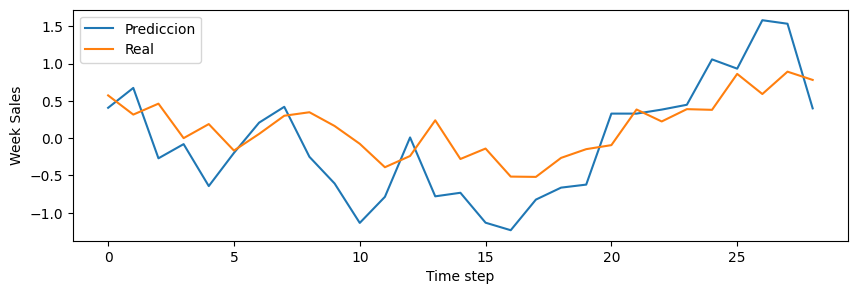

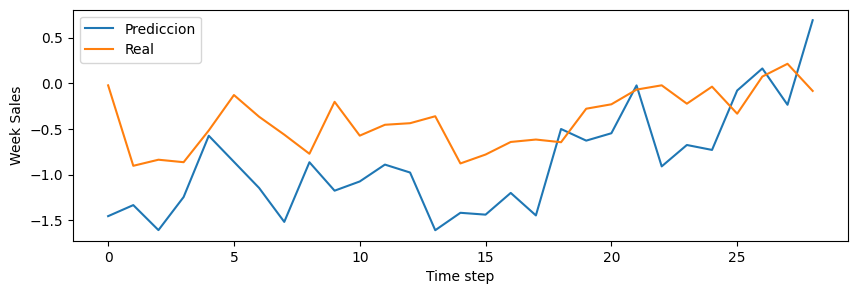

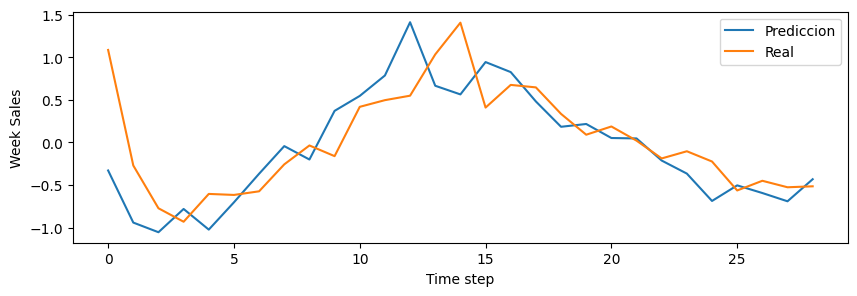

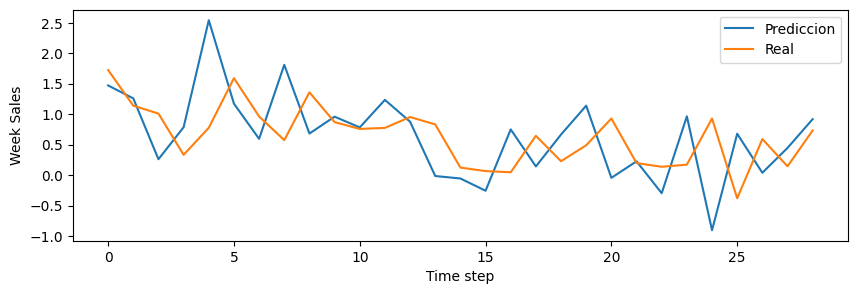

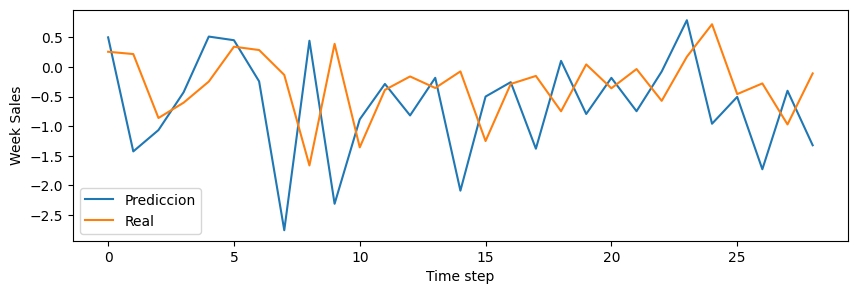

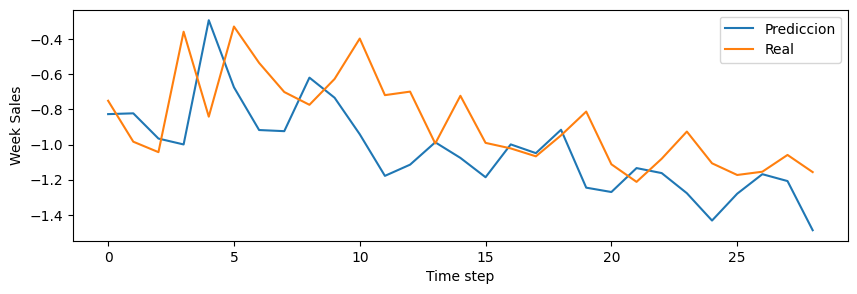

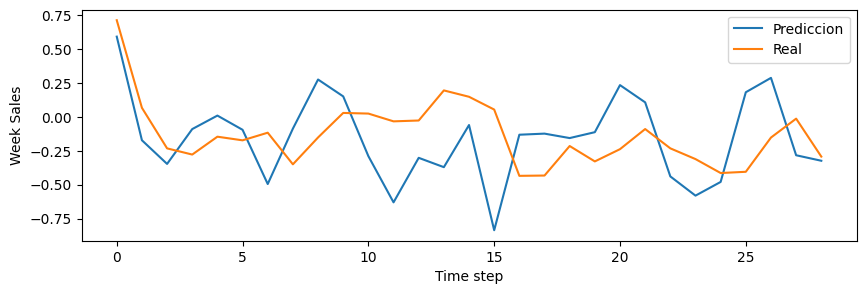

In [ ]:
series_result_predict=series_result_predict[0:10]
series_result_real=series_result_real[0:10]
for predict, real in zip(series_result_predict,series_result_real):
  #Grafico de prediccion con el valor real
  tiempo=[x for x in range(predict.shape[0])]
  plt.figure(figsize=(10,3))
  plt.plot(tiempo,real)
  plt.ylabel('Week Sales', size=10)
  plt.plot(tiempo,predict)
  plt.xlabel('Time step', size=10)
  plt.legend(['Prediccion','Real'])
  plt.show()

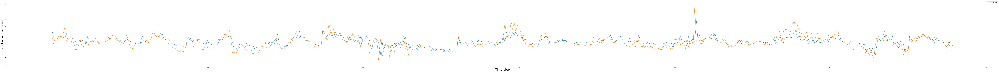

In [ ]:
#Grafico de prediccion con el valor real
tiempo=[x for x in range(Y_test.shape[0])]
plt.figure(figsize=(150,10))
plt.plot(tiempo,results)
plt.ylabel('Global_active_power', size=25)
plt.plot(tiempo,Y_test)
plt.xlabel('Time step', size=25)
plt.legend(['Prediccion','Real'])
plt.show()

##LSTM

###Exportar resultados

In [ ]:
result_LSTM=pd.read_csv('results_LSTM_Wallmart.csv')
result_LSTM = result_LSTM.sort_values(by='MSE', ascending=True)
result_LSTM.head(5)


,index,nameModel,trial_optimizacion_bayesiana,Step_validacion,time,MSE,RMSE,MAE,MAPE
52,52,LSTM_Wallmart_11_3_800_10.0_3.0_480.0_0.65_ada...,11,3,437.059806,0.480841,0.693427,0.445948,212.514267
157,157,LSTM_Wallmart_32_3_800_60.0_3.0_288.0_0.4_adam...,32,3,98.112931,0.481055,0.693581,0.458711,204.585785
82,82,LSTM_Wallmart_17_3_800_30.0_3.0_544.0_0.66_ada...,17,3,256.994795,0.481919,0.694204,0.444976,205.080780
37,37,LSTM_Wallmart_8_3_800_20.0_2.0_384.0_0.57_adam...,8,3,276.205855,0.493671,0.702617,0.459211,222.594284
182,182,LSTM_Wallmart_37_3_800_30.0_3.0_352.0_0.62_ada...,37,3,240.347845,0.497273,0.705176,0.451805,204.414932


In [ ]:
nombre_archivo=result_gru['nameModel'].iloc[0]
nombre_archivo

'GRU_Wallmart_15_3_800_20.0_3.0_660.0_0.46_adam_2.826400498186163e-05'

In [ ]:
nombre_json=nombre_archivo+"."+"json"
carpeta_destino = '/content/gdrive/MyDrive/Tesis/Datos/result_GRU'
ruta = os.path.join(carpeta_destino, nombre_json)
save_w=nombre_archivo+"."+"h5"
weights_path = os.path.join(carpeta_destino, save_w)

In [ ]:
# load json and create model
json_file = open(ruta, 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
# load weights into new model
loaded_model.load_weights(weights_path)
print("Loaded model from disk")

# evaluate loaded model on test data
loaded_model.compile(loss='mean_squared_error', optimizer=Adam(learning_rate=2.826400498186163e-05), metrics = [tf.keras.metrics.MeanSquaredError(),
                            tf.keras.metrics.RootMeanSquaredError(),
                            tf.keras.metrics.MeanAbsoluteError(),
                            tf.keras.metrics.MeanAbsolutePercentageError()])


Loaded model from disk


###Grafico de prediccion

In [ ]:
#Se da formato de entradas como: Un tensor 3D con la forma [batch, timesteps, feature]
X_train_lstm=np.array(X_train)
X_train_lstm = X_train_lstm.reshape((X_train_lstm.shape[0],1,X_train_lstm.shape[1]))

Y_train_lstm=np.array(Y_train)
Y_train_lstm = Y_train_lstm.reshape((Y_train_lstm.shape[0],1,Y_train_lstm.shape[1]))

X_test_lstm=np.array(X_test)
X_test_lstm = X_test_lstm.reshape((X_test_lstm.shape[0],1,X_test_lstm.shape[1]))

Y_test_lstm=np.array(Y_test)
Y_test_lstm = Y_test_lstm.reshape((Y_test_lstm.shape[0],1, Y_test_lstm.shape[1]))

In [ ]:
#Se realiza prediccion
results = loaded_model.predict(X_test_lstm)
results = results.reshape(shape_y_test)

19/19 [==============================] - 2s 20ms/step


In [ ]:
series_result_predict=divide_array(results,20)
series_result_real=divide_array(Y_test,20)

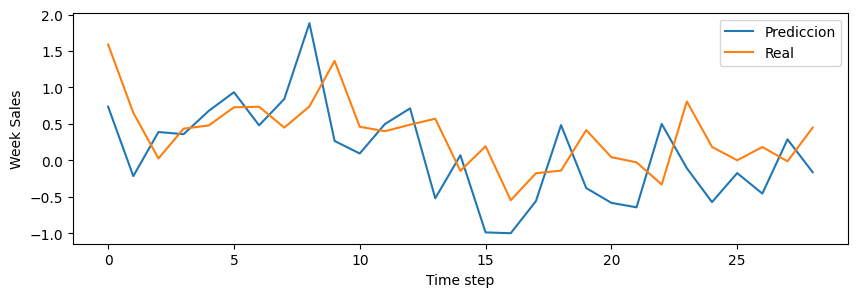

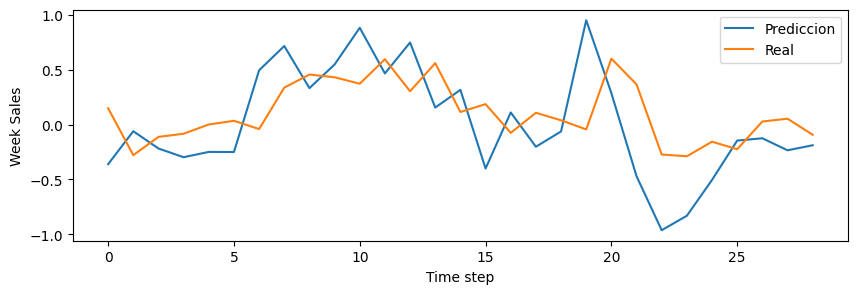

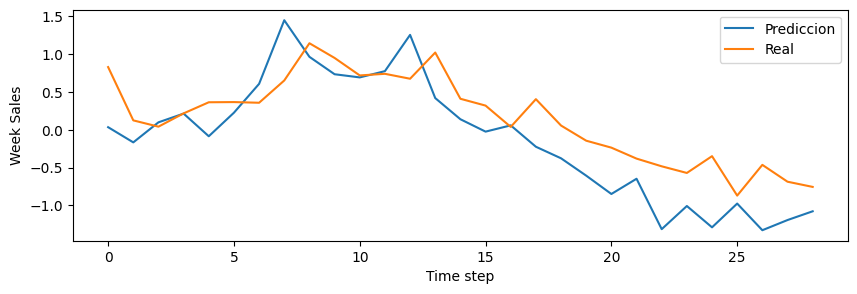

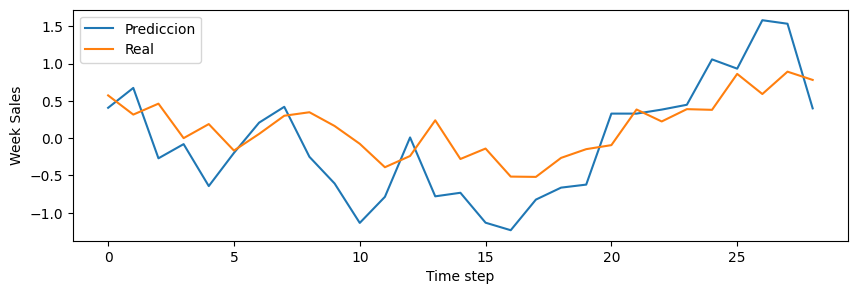

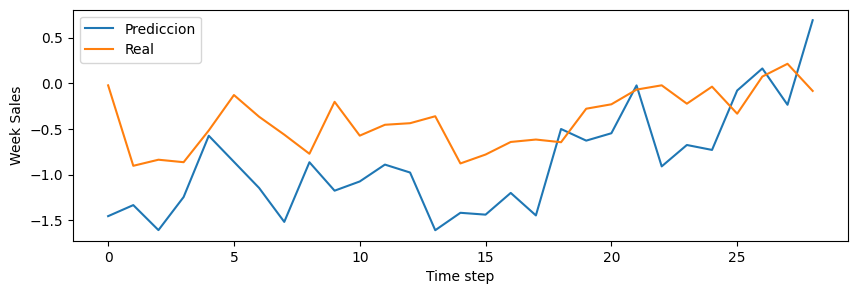

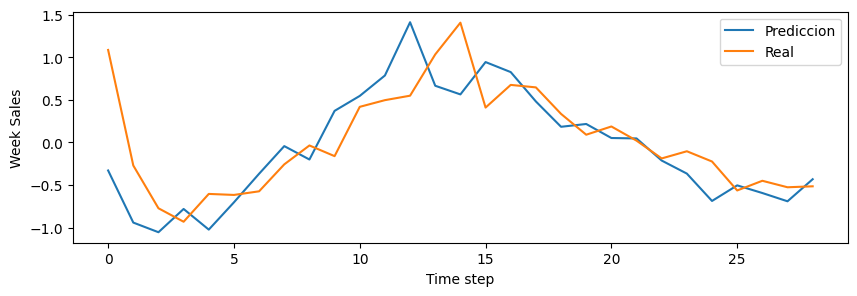

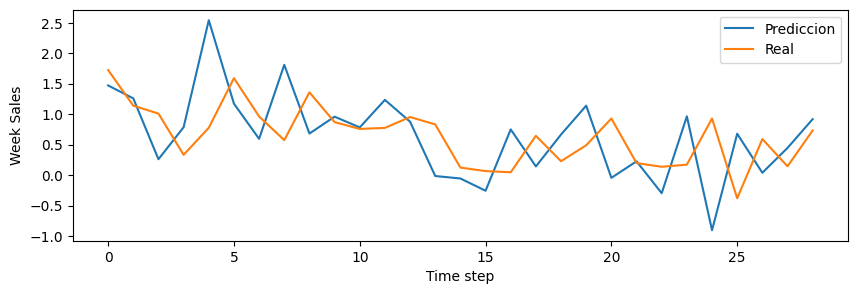

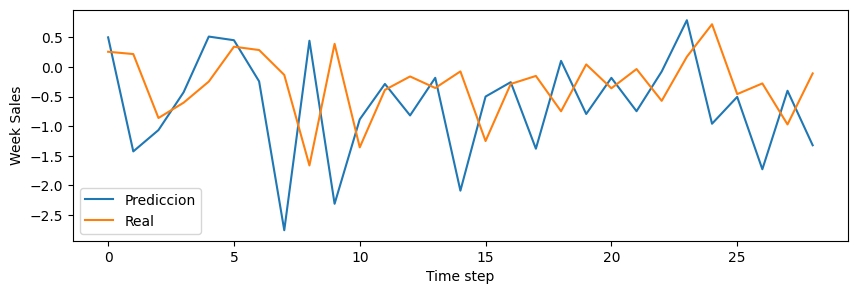

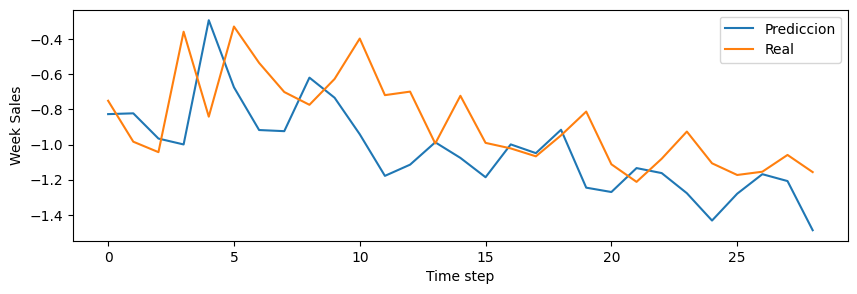

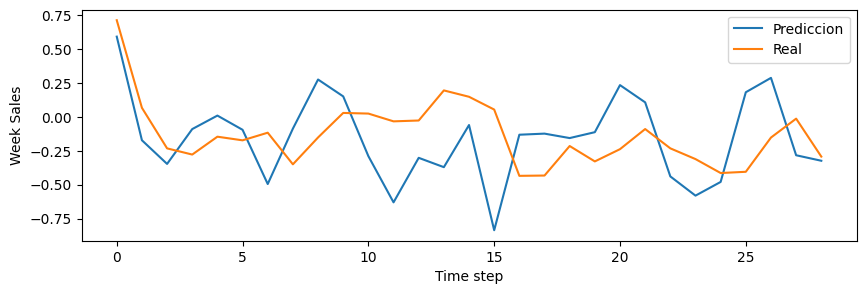

In [ ]:
series_result_predict=series_result_predict[0:10]
series_result_real=series_result_real[0:10]
for predict, real in zip(series_result_predict,series_result_real):
  #Grafico de prediccion con el valor real
  tiempo=[x for x in range(predict.shape[0])]
  plt.figure(figsize=(10,3))
  plt.plot(tiempo,real)
  plt.ylabel('Week Sales', size=10)
  plt.plot(tiempo,predict)
  plt.xlabel('Time step', size=10)
  plt.legend(['Prediccion','Real'])
  plt.show()

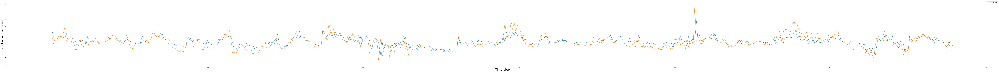

In [ ]:
#Grafico de prediccion con el valor real
tiempo=[x for x in range(Y_test.shape[0])]
plt.figure(figsize=(150,10))
plt.plot(tiempo,results)
plt.ylabel('Global_active_power', size=25)
plt.plot(tiempo,Y_test)
plt.xlabel('Time step', size=25)
plt.legend(['Prediccion','Real'])
plt.show()

##Transformer

###Exportar resultados

In [ ]:
result_gru=pd.read_csv('results_Transformer_Wallmart3.csv')
result_gru = result_gru.sort_values(by='MSE', ascending=True)
result_gru.head(5)


,index,nameModel,trial_optimizacion_bayesiana,Step_validacion,time,MSE,RMSE,MAE,MAPE
233,233,Transformer_Wallmart_47_4_800_60.0_128.0_4.0_0...,47,4,128.786824,0.393783,0.627521,0.466447,194.860733
183,183,Transformer_Wallmart_37_4_800_10.0_128.0_7.0_0...,37,4,575.220837,0.406897,0.637885,0.490450,217.820114
184,184,Transformer_Wallmart_37_5_800_10.0_128.0_7.0_0...,37,5,618.480297,0.408189,0.638897,0.497132,228.385986
199,199,Transformer_Wallmart_40_5_800_10.0_64.0_8.0_0....,40,5,639.472851,0.411071,0.641148,0.503603,195.542511
129,129,Transformer_Wallmart_26_5_800_10.0_128.0_7.0_0...,26,5,701.878154,0.414218,0.643597,0.519830,219.940002


In [ ]:
nombre_archivo=result_gru['nameModel'].iloc[0]
nombre_archivo

'Transformer_Wallmart_47_4_800_60.0_128.0_4.0_0.6_128.0_3.961513890566025e-05'

In [ ]:
nombre_json=nombre_archivo+"."+"json"
carpeta_destino = '/content/gdrive/MyDrive/Tesis/Datos/result_Transformer'
ruta = os.path.join(carpeta_destino, nombre_json)
save_w=nombre_archivo+"."+"h5"
weights_path = os.path.join(carpeta_destino, save_w)

In [ ]:
# load json and create model
json_file = open(ruta, 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
# load weights into new model
loaded_model.load_weights(weights_path)
print("Loaded model from disk")

# evaluate loaded model on test data
loaded_model.compile(loss='mean_squared_error', optimizer=Adam(learning_rate=3.961513890566025e-05), metrics = [tf.keras.metrics.MeanSquaredError(),
                            tf.keras.metrics.RootMeanSquaredError(),
                            tf.keras.metrics.MeanAbsoluteError(),
                            tf.keras.metrics.MeanAbsolutePercentageError()])


Loaded model from disk


###Grafico de prediccion

In [ ]:
#Se da formato de entradas como: Un tensor 3D con la forma [batch, timesteps, feature]
X_train_transformer=np.array(X_train)
X_train_transformer = X_train_transformer.reshape((X_train_transformer.shape[0],1,X_train_transformer.shape[1]))

Y_train_transformer=np.array(Y_train)
Y_train_transformer = Y_train_transformer.reshape((Y_train_transformer.shape[0],1,Y_train_transformer.shape[1]))

X_test_transformer=np.array(X_test)
X_test_transformer = X_test_transformer.reshape((X_test_transformer.shape[0],1,X_test_transformer.shape[1]))

Y_test_transformer=np.array(Y_test)
Y_test_transformer = Y_test_transformer.reshape((Y_test_transformer.shape[0],1, Y_test_transformer.shape[1]))

In [ ]:
#Se realiza prediccion
results = loaded_model.predict(X_test_transformer)


100/100 [==============================] - 0s 2ms/step


In [ ]:
results.shape

(3190, 1, 1)

In [ ]:
results = results.reshape(shape_y_test)

In [ ]:
series_result_predict=divide_array(results,110)
series_result_real=divide_array(Y_test,110)

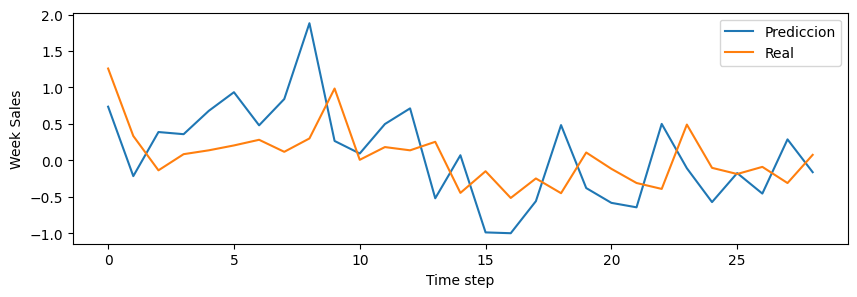

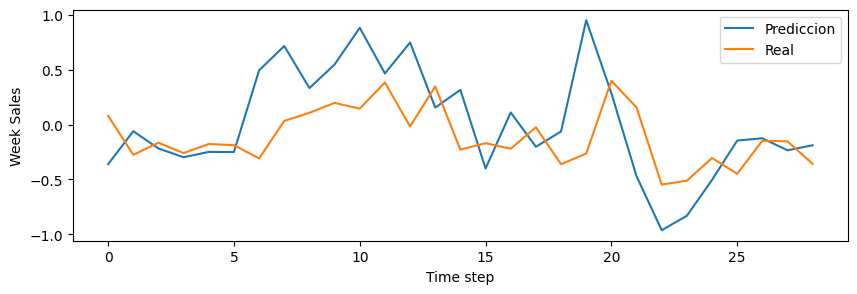

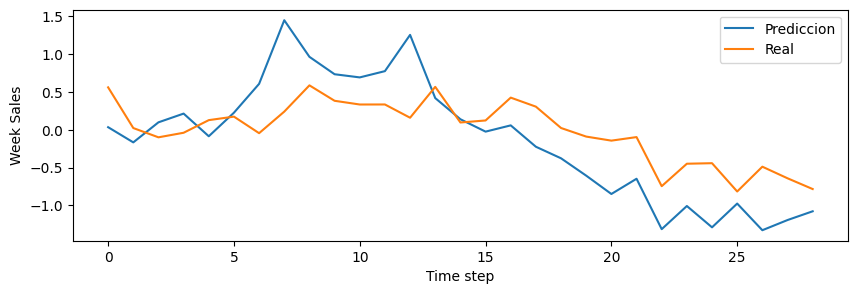

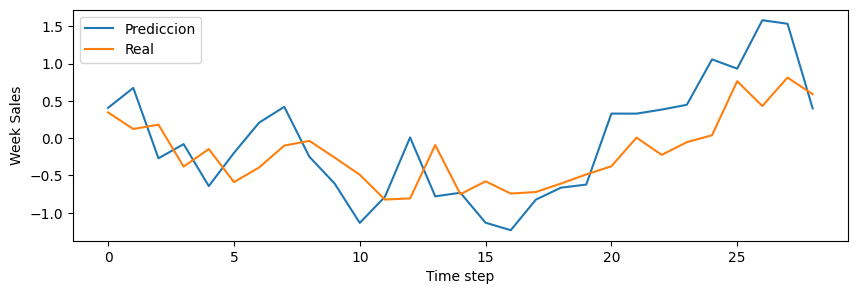

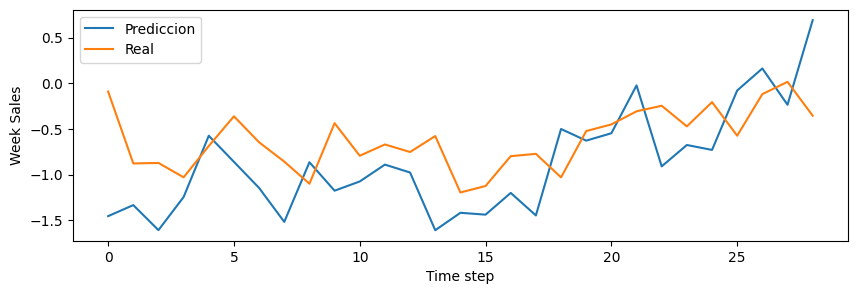

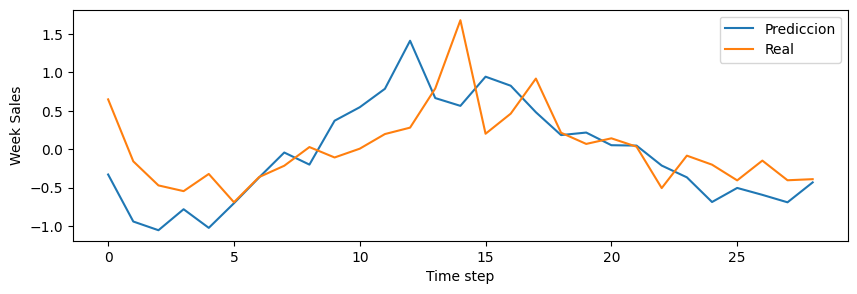

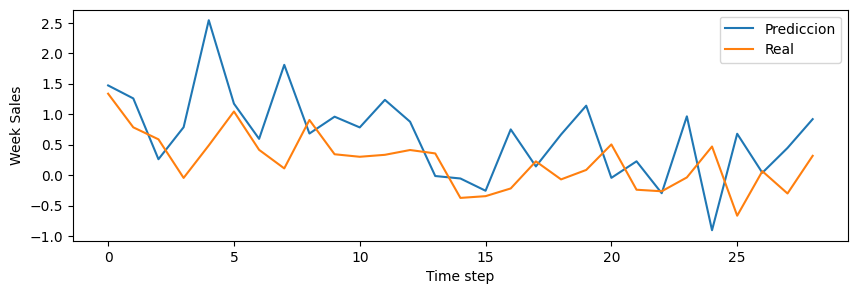

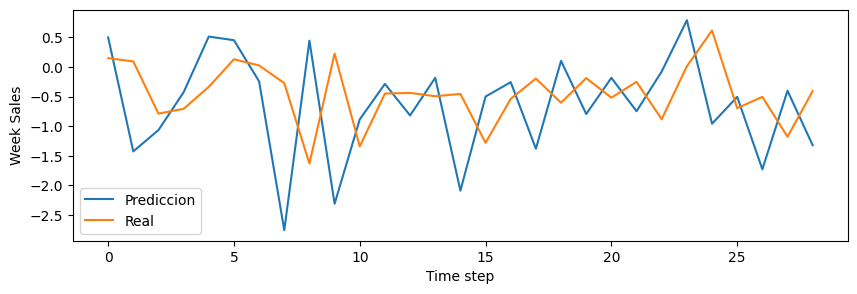

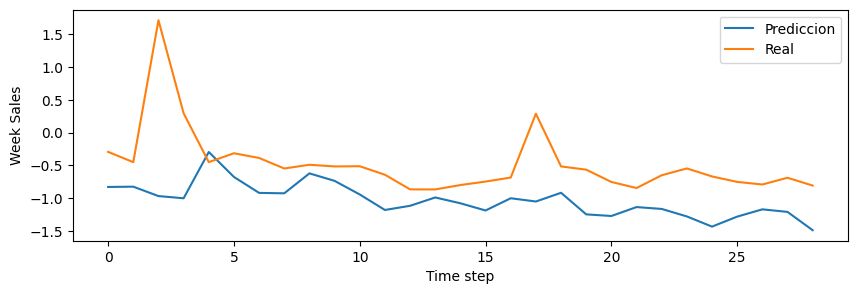

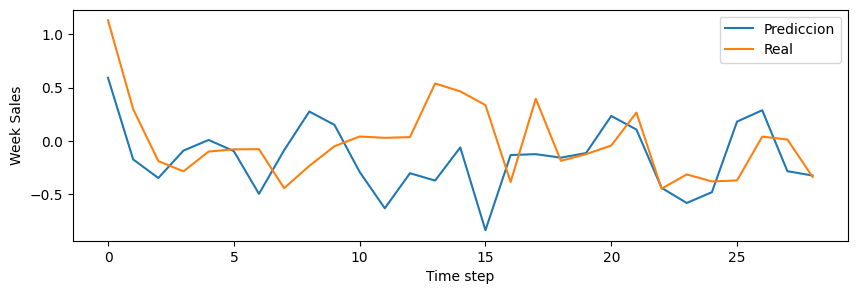

In [ ]:
series_result_predict=series_result_predict[0:10]
series_result_real=series_result_real[0:10]
for predict, real in zip(series_result_predict,series_result_real):
  #Grafico de prediccion con el valor real
  tiempo=[x for x in range(predict.shape[0])]
  plt.figure(figsize=(10,3))
  plt.plot(tiempo,real)
  plt.ylabel('Week Sales', size=10)
  plt.plot(tiempo,predict)
  plt.xlabel('Time step', size=10)
  plt.legend(['Prediccion','Real'])
  plt.show()

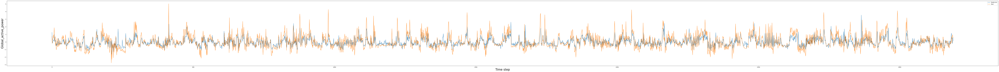

In [ ]:
#Grafico de prediccion con el valor real
tiempo=[x for x in range(Y_test.shape[0])]
plt.figure(figsize=(150,10))
plt.plot(tiempo,results)
plt.ylabel('Global_active_power', size=25)
plt.plot(tiempo,Y_test)
plt.xlabel('Time step', size=25)
plt.legend(['Prediccion','Real'])
plt.show()